In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import featureman.gen_data as man
from sklearn.cluster import SpectralClustering
import pickle
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### what to do next
- decoder/dict_atoms -> sae_hidden x mlp_dim
- relu_acts -> sae_hidden
- out -> mlp_dim

- concat(samples X filtered_sae_hidden) x mlp_dim
- einop('s f m -> (s f) m')
- PCA of that stuff

In [4]:
sae_dict = torch.load("sae_synthetic.pth", map_location=device)
sae = man.BatchedSAE_Updated(input_dim=128, n_models=5, width_ratio=4).to(device)
sae.load_state_dict(sae_dict)
syn_acts, base_feats = man.generate_hidden_data(128, 512, seed=1337)
batched_syn_acts = syn_acts.unsqueeze(0).repeat(5, 1, 1).to(device)

In [6]:
import pickle

decoder = sae.W_d[3].detach()
print(decoder.shape)
_, _, feat_acts, _ = sae(batched_syn_acts)
features = feat_acts[3].detach()
with open("syn_sae_clusters.pkl", "rb") as f:
    clusters = pickle.load(f)
clusters = [c for c in clusters if len(c) > 1]  # Filter out clusters with only one element
clusters = sorted(clusters, key=lambda x: len(x), reverse=True)  # Sort by size
print(features.shape)


torch.Size([512, 128])
torch.Size([16384, 512])


In [7]:
print(len(clusters[3]))

6


In [8]:
features_interest = features[:, clusters[3]]
decoder_interest = decoder[clusters[3], :]
reconstructions = features_interest @ decoder_interest
reconstructions.shape

torch.Size([16384, 128])

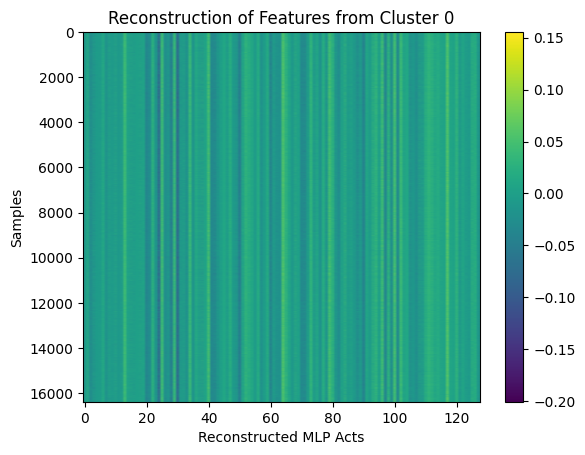

In [9]:
#imshow reconstructions
plt.imshow(reconstructions.cpu().numpy(), aspect='auto')
plt.title("Reconstruction of Features from Cluster 0")
plt.xlabel("Reconstructed MLP Acts")
plt.ylabel("Samples")
plt.colorbar()
plt.show()

In [15]:
colors = np.arange(16384)

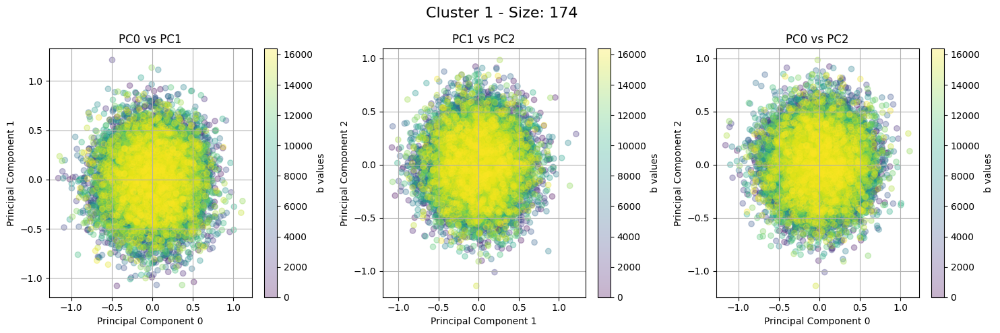

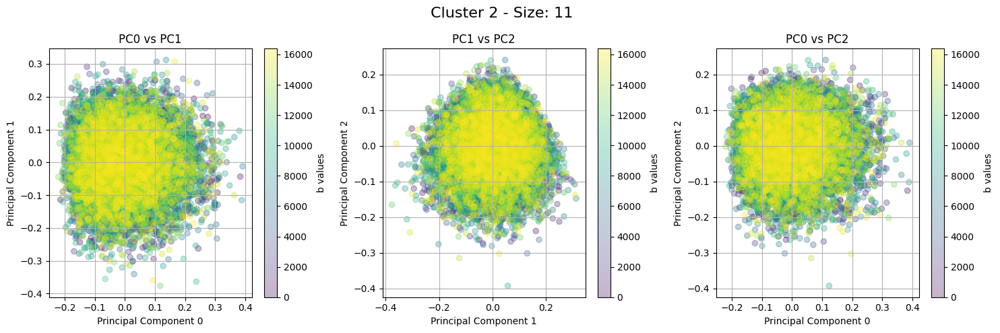

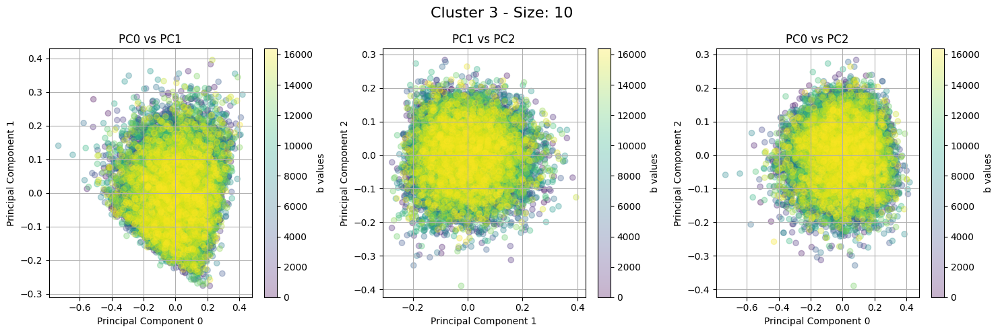

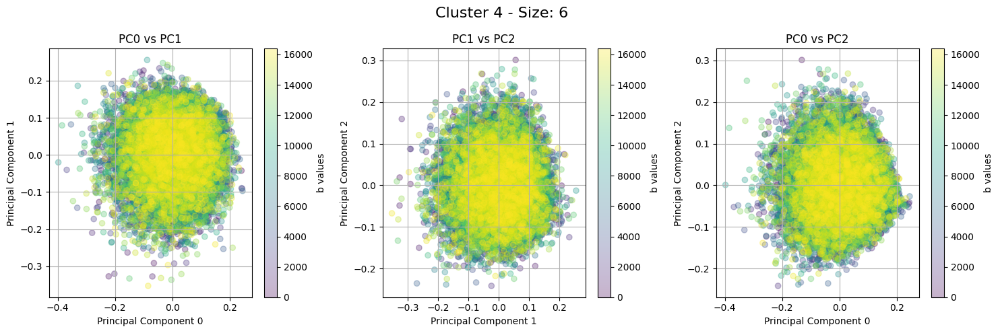

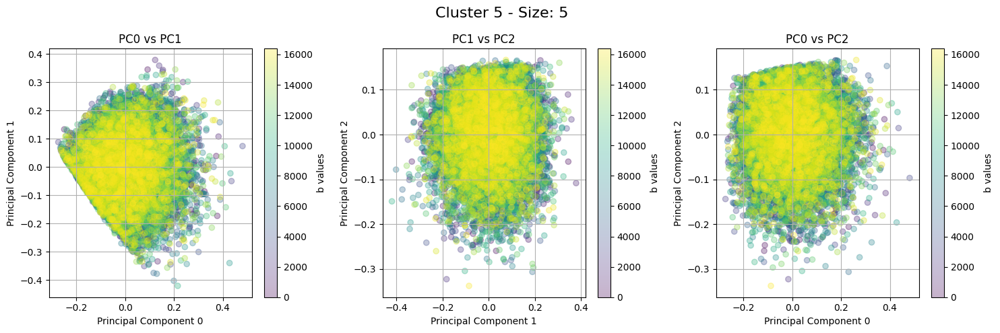

...

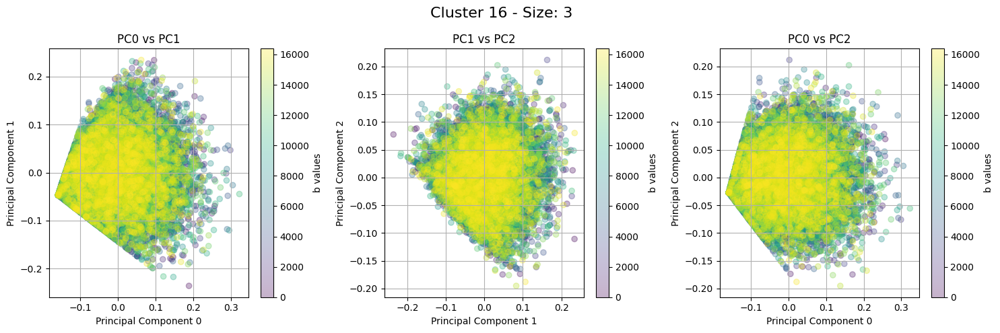

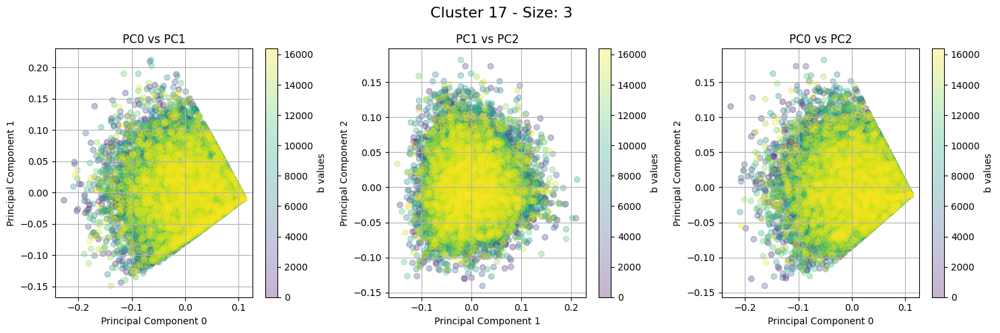

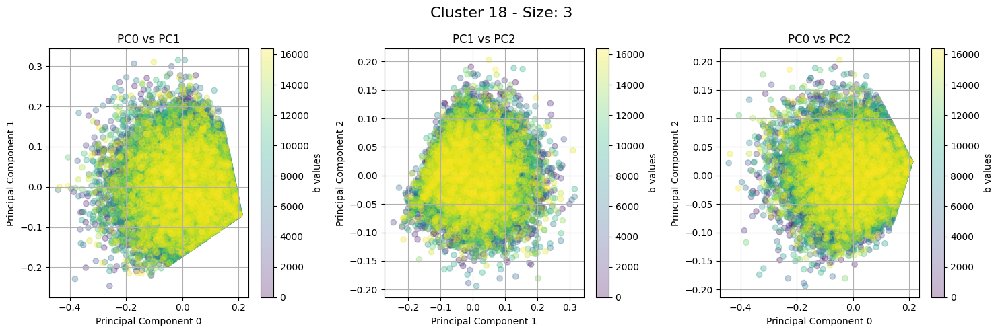

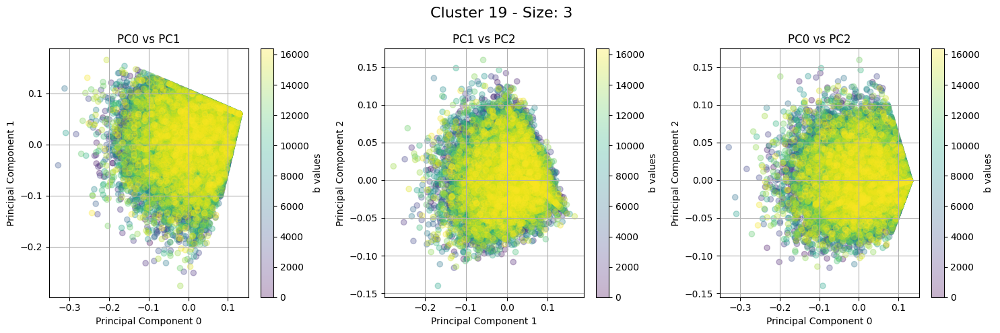

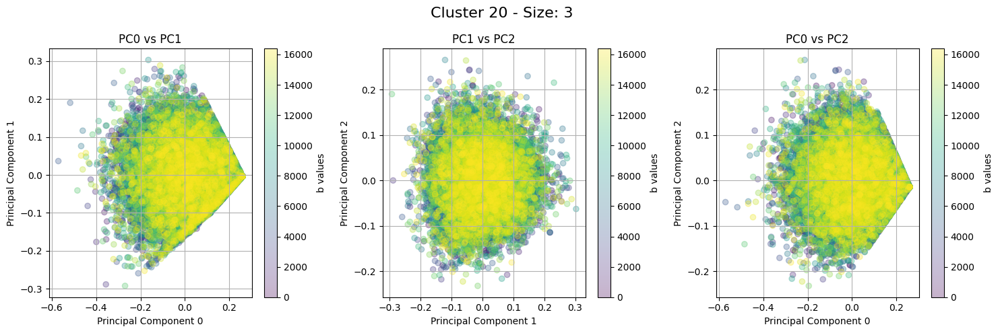

In [16]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

for i in range(len(clusters[:20])):
    features_interest = features[:, clusters[i]]
    decoder_interest = decoder[clusters[i], :]
    reconstructions = features_interest @ decoder_interest
    reconstructions.shape

    pca = PCA()
    output_pca = pca.fit_transform(reconstructions.detach().cpu().numpy())

    plt.figure(figsize=(15, 5))

    # Subplot 1: PC0 vs PC1
    plt.subplot(1, 3, 1)
    scatter1 = plt.scatter(output_pca[:, 0], output_pca[:, 1], c=colors, alpha=0.3, cmap='viridis')
    plt.title("PC0 vs PC1")
    plt.xlabel("Principal Component 0")
    plt.ylabel("Principal Component 1")
    plt.grid()
    plt.colorbar(scatter1, label='b values')

    # Subplot 2: PC1 vs PC2
    plt.subplot(1, 3, 2)
    scatter2 = plt.scatter(output_pca[:, 1], output_pca[:, 2], c=colors, alpha=0.3, cmap='viridis')
    plt.title("PC1 vs PC2")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.grid()
    plt.colorbar(scatter2, label='b values')

    # Subplot 3: PC0 vs PC2 (corrected from your original)
    plt.subplot(1, 3, 3)
    scatter3 = plt.scatter(output_pca[:, 0], output_pca[:, 2], c=colors, alpha=0.3, cmap='viridis')
    plt.title("PC0 vs PC2")  # Fixed title
    plt.xlabel("Principal Component 0")  # Fixed label
    plt.ylabel("Principal Component 2")
    plt.grid()
    plt.colorbar(scatter3, label='b values')

    #sup title
    plt.suptitle(f"Cluster {i + 1} - Size: {len(clusters[i])}", fontsize=16)

    plt.tight_layout()
    plt.show()

<BarContainer object of 10 artists>

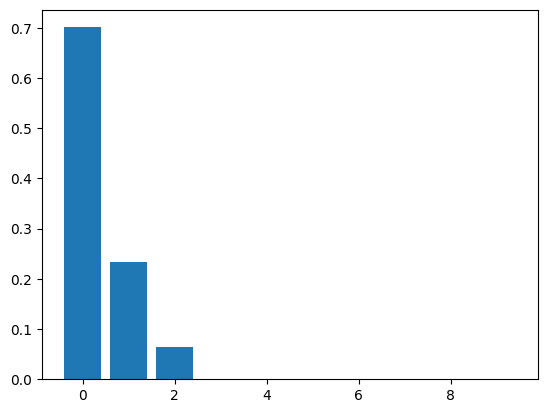

In [34]:
plt.bar(range(len(pca.explained_variance_ratio_[:10])), pca.explained_variance_ratio_[:10])